
This week we explore **explaining image classification with saliency maps** using the [PAIR Saliency Library](https://github.com/PAIR-code/saliency). Along the way, you'll build hands-on intuition for three key themes in Responsible AI.

| Theme | Where you'll encounter it in this lab |
|---|---|
| **Mechanistic Interpretability** | Comparing saliency maps across classes and models — and asking what they *can't* tell us |
| **Human-in-the-Loop AI** | Seeing models fail confidently on perturbed images — and thinking about safeguards |
| **AI Auditing, Governance & Bias** | Examining what metadata `tf.keras.applications` does (and doesn't) provide about its models |

This exercise is a modified version of the PAIR [example notebook](https://github.com/PAIR-code/saliency/blob/master/Examples_core.ipynb) — we use only the Gradient and SmoothGrad methods here, but see the PAIR notebook for additional methods.

We use TensorFlow 2 in this notebook. If you prefer PyTorch, PAIR also have a [PyTorch example](https://github.com/PAIR-code/saliency/blob/master/Examples_pytorch.ipynb) and you can find pre-trained PyTorch models [here](https://pytorch.org/vision/stable/models.html).

You will need to add the images uploaded on Moodle to your Colab files (the folder icon in the left sidebar).

## What are Saliency Maps

They are a tool used to enhance the interpretability of Computer Vision ML models. In particular, they can help us understand what the convolutional layers in these models ***see*** and base their decisions on.

## Install and import libraries


In [ ]:
# Install required libraries
!pip install saliency
!pip install requests
print("All packages installed ✓")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.2/86.2 kB 1.9 MB/s eta 0:00:00
All packages installed ✓


In [ ]:
# Boilerplate imports.
import tensorflow as tf
import numpy as np
import PIL.Image
from matplotlib import pylab as P
import requests

# From PAIR saliency repository.
import saliency.core as saliency

%matplotlib inline

In [ ]:
# Load ImageNet class labels so we can show human-readable class names
import json as _json
_resp = requests.get("https://storage.googleapis.com/download.tensorflow.org/data/imagenet_class_index.json")
imagenet_labels = {int(k): v[1] for k, v in _resp.json().items()}

def get_class_name(class_idx):
    """Return human-readable ImageNet class name."""
    return imagenet_labels.get(class_idx, f"Unknown-{class_idx}")

# Quick test
print("Class 236:", get_class_name(236))   # Doberman
print("Class 281:", get_class_name(281))   # tabby
print("Class 207:", get_class_name(207))   # golden_retriever
print("Class 208:", get_class_name(208))   # Labrador_retriever
print(f"\nLoaded {len(imagenet_labels)} ImageNet class labels.")

Class 236: Doberman
Class 281: tabby
Class 207: golden_retriever
Class 208: Labrador_retriever

Loaded 1000 ImageNet class labels.


## Utility methods
**Note:** If you were to try using a differenet model, you would need to modify the "PreprocessImage" method, as different models require different pre-processing.

In [ ]:
# Boilerplate methods.
def ShowImage(im, title='', ax=None):
  if ax is None:
    P.figure()
  P.axis('off')
  P.imshow(im)
  P.title(title)

def ShowGrayscaleImage(im, title='', ax=None):
  if ax is None:
    P.figure()
  P.axis('off')

  P.imshow(im, cmap=P.cm.gray, vmin=0, vmax=1)
  P.title(title)

def ShowHeatMap(im, title, ax=None):
  if ax is None:
    P.figure()
  P.axis('off')
  P.imshow(im, cmap='inferno')
  P.title(title)

def LoadImage(url_or_filepath):
       if url_or_filepath.startswith('http'): # If it's a URL
           response = requests.get(url_or_filepath, stream=True)
           response.raise_for_status()  # Raise an exception for bad responses
           im = PIL.Image.open(response.raw)
       else: # If it's a local file path
           im = PIL.Image.open(url_or_filepath)
       im = im.resize((224, 224))
       im = np.asarray(im)
       return im

def PreprocessImage(im):
  im = tf.keras.applications.vgg16.preprocess_input(im)
  return im

## Loading in a model

In this case we are loading in the (pre-trained) VGG16 model for the [ImageNet](https://www.image-net.org/about.php) dataset (ImageNet is a dataset of ~14Million images, with 1,000 classes - it is one of the most popular benchmarking datasets for image classification).

Tensorflow/Keras have a range of models pre-trained on ImageNet (which is very handy as training with such a large image dataset is very time consuming and compute intensive!) - a table of these models and some of there properties (accuracy, size, etc.) is [here](https://keras.io/api/applications/).

The documentation for the model we are using (including the preprocessing needed) can be found in the [Keras API](https://keras.io/api/applications/vgg/#vgg16-function) and in the [Tensorflow API](https://www.tensorflow.org/api_docs/python/tf/keras/applications/vgg16/VGG16) (these contain basically the same information, just formatted differently, so you can look at whichever you prefer). In both you can an navigate to the info for other models via the menu on the left.

In [ ]:
# Change the below line to load in a different model!
m = tf.keras.applications.vgg16.VGG16(weights='imagenet', include_top=True)
model = tf.keras.models.Model([m.inputs], [m.output])

553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 8s 0us/step


call_model_function is how we pass inputs to our model and receive outputs necessary to compute saliency masks. The description of this method and necessary outputs is in the PAIR Library in the base CoreSaliency description, as well as separately for each method.

In [ ]:
class_idx_str = 'class_idx_str'
def call_model_function(images, call_model_args=None, expected_keys=None):
    target_class_idx =  call_model_args[class_idx_str]  # extracts target class
    images = tf.convert_to_tensor(images)
    with tf.GradientTape() as tape:  # records operations for automatic diff.
      if expected_keys==[saliency.base.INPUT_OUTPUT_GRADIENTS]:  # SM needs all input-output gradients
          tape.watch(images)
          output_layer = model(images)
          output_layer = output_layer[:,target_class_idx]
          gradients = np.array(tape.gradient(output_layer, images))  # contribution of each pixel to output
          return {saliency.base.INPUT_OUTPUT_GRADIENTS: gradients}
      else:  # SM needs value of specific conv layer
          conv_layer, output_layer = model(images)
          gradients = np.array(tape.gradient(output_layer, conv_layer))
          return {saliency.base.CONVOLUTION_LAYER_VALUES: conv_layer,
                  saliency.base.CONVOLUTION_OUTPUT_GRADIENTS: gradients}

## Loading Image and Using Model to Predict Class

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor']]
Received: inputs=['Tensor(shape=(1, 224, 224, 3))']
  warnings.warn(msg)


Prediction class: 236


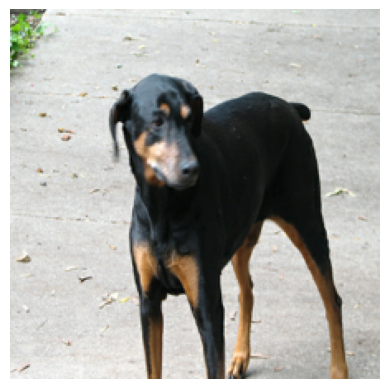

In [ ]:
# Load the image
im_orig = LoadImage("https://drive.google.com/uc?export=view&id=1QVNoa3alXjpvTN0GrrCm2Tf-ZCuffCPf")
im = PreprocessImage(im_orig)  # according to VGG16 requirements

# Show the image
ShowImage(im_orig)

predictions = model([np.array([im])])
prediction_class = np.argmax(predictions[0])
call_model_args = {class_idx_str: prediction_class}

print("Prediction class: " + str(prediction_class))  # Should be a doberman, class idx = 236

## Saliency Methods - Gradient

The [gradient saliency method](https://www.semanticscholar.org/paper/Deep-Inside-Convolutional-Networks%3A-Visualising-and-Simonyan-Vedaldi/dc6ac3437f0a6e64e4404b1b9d188394f8a3bf71) (sometimes, including in the PAIR code, also called "vanilla gradient", "grad" or even just "saliency map") is one of the earliest saliency methods (from way back in 2013!). It works by taking the gradient of the class score with respect to the input. It does this for a chosen class, in the following examples (as with most examples you will see) we use the model's predicted class. For more detail on how the method works and the reasoning behind it, see section 3 of the [original paper](https://www.semanticscholar.org/reader/dc6ac3437f0a6e64e4404b1b9d188394f8a3bf71).

As we will see, the maps it produces can appear noisy, something which the methods we will look at after attempted to improve on.

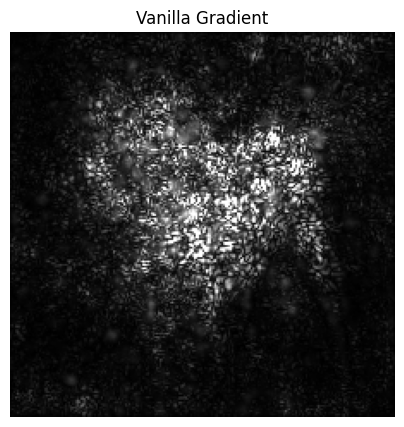

In [ ]:
# Construct the saliency object. This alone doesn't do anthing.
gradient_saliency = saliency.GradientSaliency()

# Compute the vanilla mask.
vanilla_mask_3d = gradient_saliency.GetMask(im, call_model_function, call_model_args)

# Call the visualization methods to convert the 3D tensors to 2D grayscale.
vanilla_mask_grayscale = saliency.VisualizeImageGrayscale(vanilla_mask_3d)

# Set up matplot lib figures.
ROWS = 1
COLS = 1
UPSCALE_FACTOR = 5
P.figure(figsize=(ROWS * UPSCALE_FACTOR, COLS * UPSCALE_FACTOR))

# Render the saliency masks.
ShowGrayscaleImage(vanilla_mask_grayscale, title='Vanilla Gradient', ax=P.subplot(ROWS, COLS, 1))

## Saliency Methods - SmoothGrad

[SmoothGrad](https://www.semanticscholar.org/paper/SmoothGrad%3A-removing-noise-by-adding-noise-Smilkov-Thorat/f538dca4def5167a32fbc12107b69a05f0c9d832) attempted to improve on the original gradient method by doing something somewhat counterintuitive - adding noise to the input! They generate several perturbed versions of the input image by adding random gaussian noise to the input image, then generate saliency maps for each of these, the final saliency map being an average across all examples. Their logic is that adding this noise and averaging smoothes the gradient, leading to less noisy and more visually coherent maps, however this has been disputed in later work - it is still not fully understood why the SmoothGrad method produces clearer looking maps!

This time we'll show the Gradient map next to the SmoothGrad map, so we can compare between them.



**Note:** SmoothGrad will take longer to run because it is taking the gradient several times (once for each perturbed example). There may also be some variation between maps each time you run it, as the noise added is generated randomly.

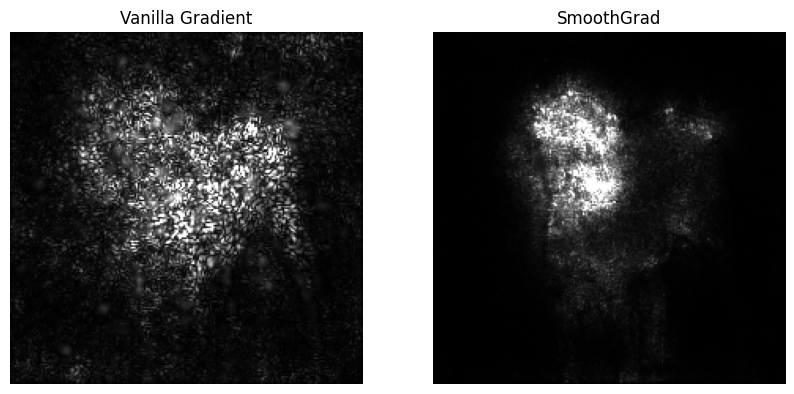

In [ ]:

# Compute SmoothGrad mask.
smoothgrad_mask_3d = gradient_saliency.GetSmoothedMask(im, call_model_function, call_model_args)

# Call the visualization methods to convert the 3D tensors to 2D grayscale.
smoothgrad_mask_grayscale = saliency.VisualizeImageGrayscale(smoothgrad_mask_3d)

# Set up matplot lib figures.
ROWS = 1
COLS = 2
UPSCALE_FACTOR = 10
P.figure(figsize=(ROWS * UPSCALE_FACTOR, COLS * UPSCALE_FACTOR))

# Render the saliency masks.
ShowGrayscaleImage(vanilla_mask_grayscale, title='Vanilla Gradient', ax=P.subplot(ROWS, COLS, 1))
ShowGrayscaleImage(smoothgrad_mask_grayscale, title='SmoothGrad', ax=P.subplot(ROWS, COLS, 2))

### Post-Hoc Explanations and Their Limits

You've now generated both Gradient and SmoothGrad saliency maps for the doberman image. These methods are **post-hoc** and **model-agnostic** — they treat the model as a black box and ask "which input pixels matter most for this output?"

But consider: do these maps tell you ***why*** the model learned to associate certain pixels with "doberman", or just ***that*** it responds to certain pixels? There's a big difference.

**Mechanistic interpretability** takes a different approach — looking *inside* the model rather than just probing its inputs and outputs. Techniques like **linear probes**, **sparse autoencoders (SAEs)**, and **activation patching** try to find individual neurons or circuits responsible for specific concepts.

**Reflection:** If you could find a specific neuron that fires only for "floppy ears", would that be more informative than a saliency map highlighting the ear region? What would each tell you that the other can't?

**Exercise below:** Let's test the limits of saliency by computing maps for a *wrong* class — what does the model "look at" when asked to explain a class it didn't predict?

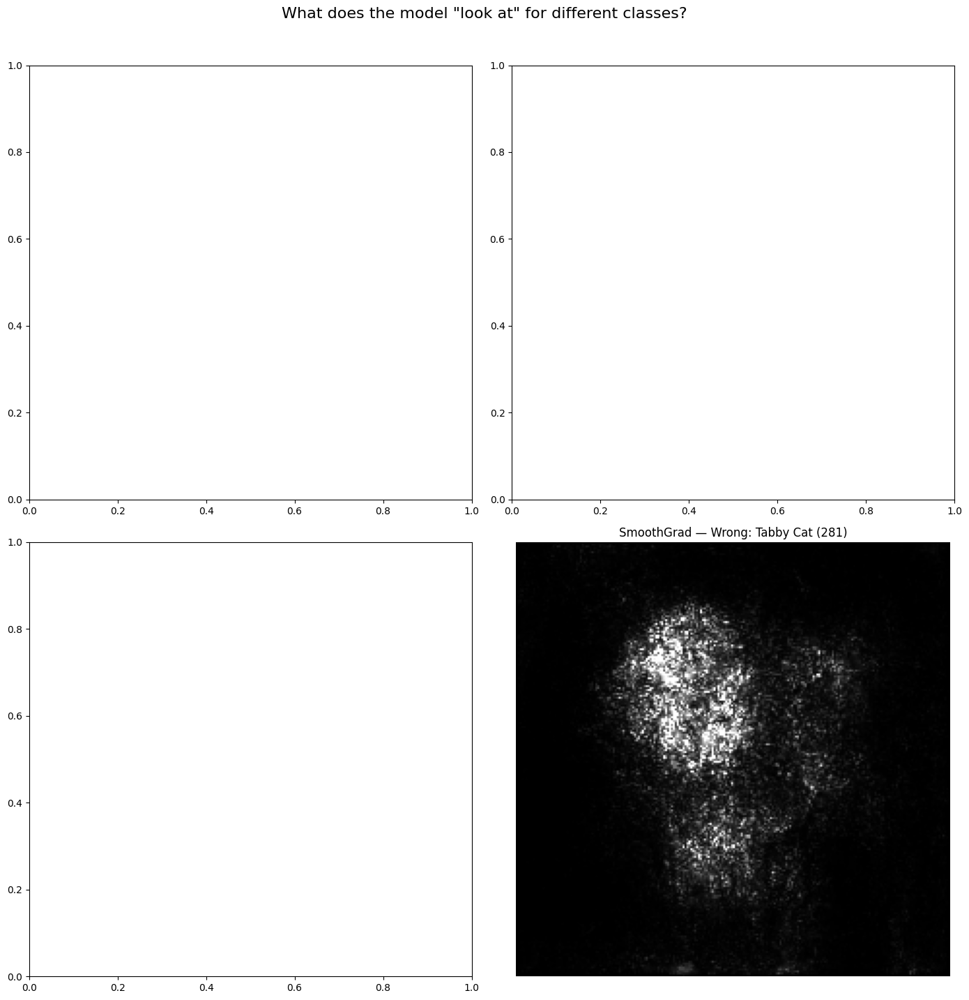

>> Do the maps for 'tabby cat' highlight different regions than 'doberman'?
>> Saliency tells us WHERE the model looks, but not WHY it learned those features.
>> Mechanistic interpretability tries to answer the WHY.


In [ ]:
# Exercise: Compare saliency maps for the PREDICTED class vs a WRONG class.
# The doberman was predicted as class 236. What happens if we ask:
# "why is this a tabby cat (class 281)?"

# Re-load doberman to ensure clean state
im_dob = LoadImage("https://drive.google.com/uc?export=view&id=1QVNoa3alXjpvTN0GrrCm2Tf-ZCuffCPf")
im_dob_pre = PreprocessImage(im_dob)

# Saliency for the PREDICTED class (doberman = 236)
predicted_args = {class_idx_str: 236}
vanilla_predicted = gradient_saliency.GetMask(im_dob_pre, call_model_function, predicted_args)
smooth_predicted = gradient_saliency.GetSmoothedMask(im_dob_pre, call_model_function, predicted_args)

# Saliency for a WRONG class (tabby cat = 281)
wrong_args = {class_idx_str: 281}
vanilla_wrong = gradient_saliency.GetMask(im_dob_pre, call_model_function, wrong_args)
smooth_wrong = gradient_saliency.GetSmoothedMask(im_dob_pre, call_model_function, wrong_args)

# Visualise side by side
fig, axes = P.subplots(2, 2, figsize=(14, 14))

ShowGrayscaleImage(saliency.VisualizeImageGrayscale(vanilla_predicted),
                   title='Gradient — Predicted: Doberman (236)', ax=axes[0, 0])
ShowGrayscaleImage(saliency.VisualizeImageGrayscale(smooth_predicted),
                   title='SmoothGrad — Predicted: Doberman (236)', ax=axes[0, 1])
ShowGrayscaleImage(saliency.VisualizeImageGrayscale(vanilla_wrong),
                   title='Gradient — Wrong: Tabby Cat (281)', ax=axes[1, 0])
ShowGrayscaleImage(saliency.VisualizeImageGrayscale(smooth_wrong),
                   title='SmoothGrad — Wrong: Tabby Cat (281)', ax=axes[1, 1])

P.suptitle('What does the model "look at" for different classes?', fontsize=16, y=1.02)
P.tight_layout()
P.show()

print(">> Do the maps for 'tabby cat' highlight different regions than 'doberman'?")
print(">> Saliency tells us WHERE the model looks, but not WHY it learned those features.")
print(">> Mechanistic interpretability tries to answer the WHY.")

### Exercise: Top-5 Class Saliency Sweep

The previous exercise compared saliency for the predicted class vs. one wrong class. But the model doesn't just output one class — it outputs a probability distribution over **1,000 classes**. Let's see what the model focuses on for each of its **top-5** predictions.

If saliency maps are truly class-specific, we'd expect different maps for different classes. If the maps look suspiciously similar regardless of class, that tells us something important about the limitations of gradient-based explanations.

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


Top-5 predicted classes for the doberman image:
  #1: Class 236 (Doberman) — 74.56%
  #2: Class 165 (black-and-tan_coonhound) — 24.85%
  #3: Class 234 (Rottweiler) — 0.21%
  #4: Class 237 (miniature_pinscher) — 0.15%
  #5: Class 176 (Saluki) — 0.09%


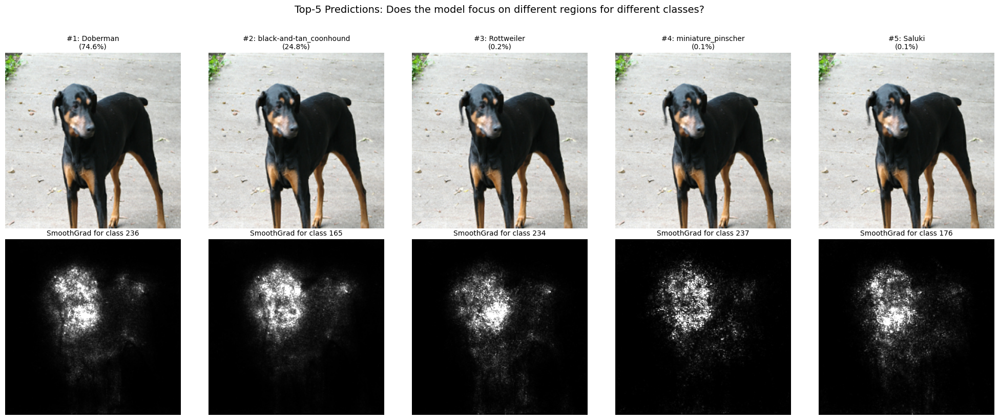


>> Do the saliency maps differ across classes, or do they look suspiciously similar?
>> This is a known limitation of gradient-based saliency — the maps can be
>> insensitive to the target class, raising questions about their faithfulness.


In [ ]:
# Saliency maps for the top-5 predicted classes on the doberman image
predictions_dob = model(np.array([im_dob_pre])).numpy()[0]
top5_classes = np.argsort(predictions_dob)[-5:][::-1]

print("Top-5 predicted classes for the doberman image:")
for rank, cls in enumerate(top5_classes, 1):
    print(f"  #{rank}: Class {cls} ({get_class_name(cls)}) — {predictions_dob[cls]*100:.2f}%")

# Compute SmoothGrad saliency for each of the top-5 classes
fig, axes = P.subplots(2, 5, figsize=(20, 8))

for col, cls in enumerate(top5_classes):
    cls_args = {class_idx_str: int(cls)}
    mask_3d = gradient_saliency.GetSmoothedMask(im_dob_pre, call_model_function, cls_args)
    mask_gray = saliency.VisualizeImageGrayscale(mask_3d)

    # Row 0: original image with class label
    axes[0, col].imshow(im_dob)
    axes[0, col].set_title(f"#{col+1}: {get_class_name(cls)}\n({predictions_dob[cls]*100:.1f}%)", fontsize=10)
    axes[0, col].axis('off')

    # Row 1: saliency map
    axes[1, col].imshow(mask_gray, cmap=P.cm.gray, vmin=0, vmax=1)
    axes[1, col].set_title(f"SmoothGrad for class {cls}", fontsize=10)
    axes[1, col].axis('off')

P.suptitle("Top-5 Predictions: Does the model focus on different regions for different classes?",
           fontsize=14, y=1.02)
P.tight_layout()
P.show()

print("\n>> Do the saliency maps differ across classes, or do they look suspiciously similar?")
print(">> This is a known limitation of gradient-based saliency — the maps can be")
print(">> insensitive to the target class, raising questions about their faithfulness.")

### Exercise: What Do Different Layers "See"?

Saliency maps show which **input pixels** matter, but they tell us nothing about what happens **inside** the model. Let's peek inside VGG16 by visualising the **feature maps** (activations) at different layers.

- **Early layers** (e.g. `block1_conv2`) tend to detect simple features: edges, colours, textures
- **Middle layers** (e.g. `block3_conv3`) combine these into more complex patterns
- **Late layers** (e.g. `block5_conv3`) respond to high-level, object-like features

This is the basic intuition behind **mechanistic interpretability** — understanding what individual neurons and layers have learned to represent.

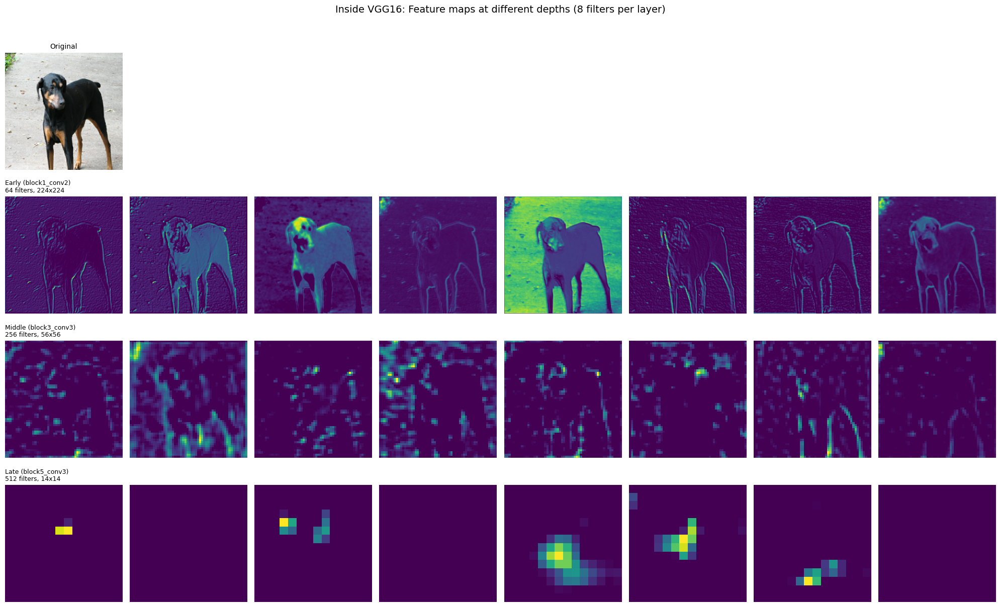

>> Early layers: edges, color gradients — simple, universal features
>> Middle layers: textures, repeating patterns — more specific
>> Late layers: complex shapes, object parts — class-relevant features

>> Mechanistic interpretability asks: can we systematically understand what
>> each neuron has learned? Techniques like linear probes and sparse
>> autoencoders (SAEs) try to do exactly this. 


In [13]:
# Visualise feature maps from early, middle, and late layers of VGG16
layer_names = ['block1_conv2', 'block3_conv3', 'block5_conv3']
layer_labels = ['Early (block1_conv2)\n64 filters, 224x224',
                'Middle (block3_conv3)\n256 filters, 56x56',
                'Late (block5_conv3)\n512 filters, 14x14']

# Build a model that outputs intermediate activations (using the original VGG16 model 'm')
intermediate_model = tf.keras.Model(
    inputs=m.input,
    outputs=[m.get_layer(name).output for name in layer_names]
)

# Get activations for the doberman image
activations = intermediate_model(np.array([im_dob_pre]))

# Visualize 8 feature maps (filters) from each layer
n_filters = 8
fig, axes = P.subplots(1 + len(layer_names), n_filters, figsize=(20, 12))

# Row 0: original image in first cell, rest blank
axes[0, 0].imshow(im_dob)
axes[0, 0].set_title('Original', fontsize=10)
axes[0, 0].axis('off')
for col in range(1, n_filters):
    axes[0, col].axis('off')

# Rows 1-3: feature maps from each layer
for row, (act, label) in enumerate(zip(activations, layer_labels), 1):
    for col in range(n_filters):
        axes[row, col].imshow(act[0, :, :, col], cmap='viridis')
        axes[row, col].axis('off')
    axes[row, 0].set_title(label, fontsize=9, loc='left')

P.suptitle("Inside VGG16: Feature maps at different depths (8 filters per layer)",
           fontsize=14, y=1.02)
P.tight_layout()
P.show()

print(">> Early layers: edges, color gradients — simple, universal features")
print(">> Middle layers: textures, repeating patterns — more specific")
print(">> Late layers: complex shapes, object parts — class-relevant features")
print()
print(">> Mechanistic interpretability asks: can we systematically understand what")
print(">> each neuron has learned? Techniques like linear probes and sparse")
print(">> autoencoders (SAEs) try to do exactly this. ")

## Repeating with a different image

Now let's try Grad and SmoothGrad with a different image. If you want you can try loading in your own image to see what the network predicts and how the maps look, just modify the image path to contain the correct image name for your chosen image.

You can find a list of the imageNet class labels [here](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), in case you want to try running your code with a different image and want to know what class your model has predicted.

Prediction class: 207


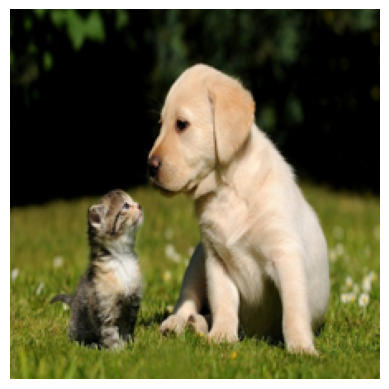

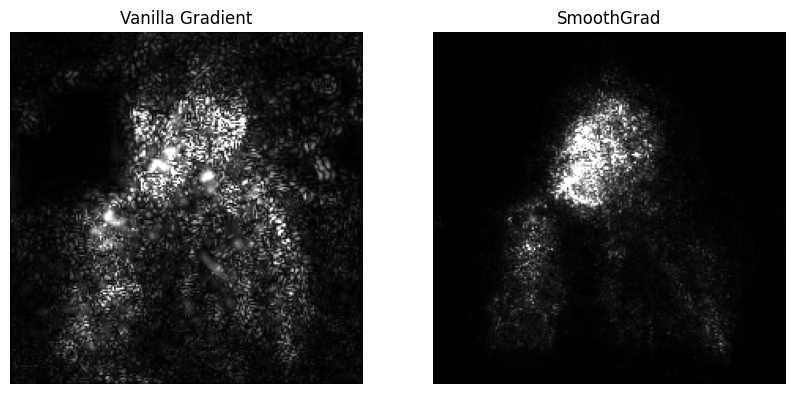

In [14]:
# Load the image
#Change the path in the line below if you want to try with a different image.
im_orig2 = LoadImage("https://drive.google.com/uc?export=view&id=1TuO4OoRutwpkwxr_T7W-imz5QvlIP20E")
im = PreprocessImage(im_orig2)

# Show the image
ShowImage(im_orig2)

predictions = model([np.array([im])])
prediction_class = np.argmax(predictions[0])
call_model_args = {class_idx_str: prediction_class}

print("Prediction class: " + str(prediction_class))  # For this image, the model predicts class 207, which is "Golden retriever"


# Compute the vanilla mask and the smoothed mask.
vanilla_mask_3d = gradient_saliency.GetMask(im, call_model_function, call_model_args)
smoothgrad_mask_3d = gradient_saliency.GetSmoothedMask(im, call_model_function, call_model_args)

# Call the visualization methods to convert the 3D tensors to 2D grayscale.
vanilla_mask_grayscale = saliency.VisualizeImageGrayscale(vanilla_mask_3d)
smoothgrad_mask_grayscale = saliency.VisualizeImageGrayscale(smoothgrad_mask_3d)

# Set up matplot lib figures.
ROWS = 1
COLS = 2
UPSCALE_FACTOR = 10
P.figure(figsize=(ROWS * UPSCALE_FACTOR, COLS * UPSCALE_FACTOR))

# Render the saliency masks.
ShowGrayscaleImage(vanilla_mask_grayscale, title='Vanilla Gradient', ax=P.subplot(ROWS, COLS, 1))
ShowGrayscaleImage(smoothgrad_mask_grayscale, title='SmoothGrad', ax=P.subplot(ROWS, COLS, 2))


## What if we want to compare the maps from two different models?

We'll try a [ResNet50](https://www.tensorflow.org/api_docs/python/tf/keras/applications/resnet50/ResNet50) as our second model.

(If you want to see more about the different structures of the models, try calling model.summary() on each - it gives some details on the layers and parameters)

In [15]:
def PreprocessImageRes(im):
  im = tf.keras.applications.resnet50.preprocess_input(im)
  return im


m2 = tf.keras.applications.resnet50.ResNet50(weights='imagenet', include_top=True)
#Note we are overwriting "model" to be ResNet50, so from here we are using that model
model = tf.keras.models.Model([m2.inputs], [m2.output])


102967424/102967424 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_23']]
Received: inputs=['Tensor(shape=(1, 224, 224, 3))']
  warnings.warn(msg)


Prediction class: 208


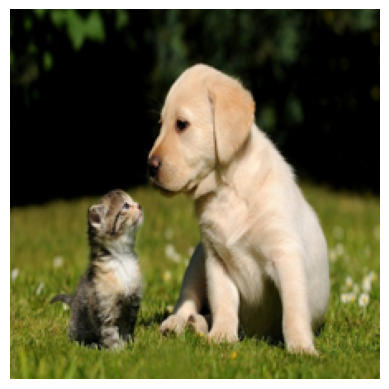

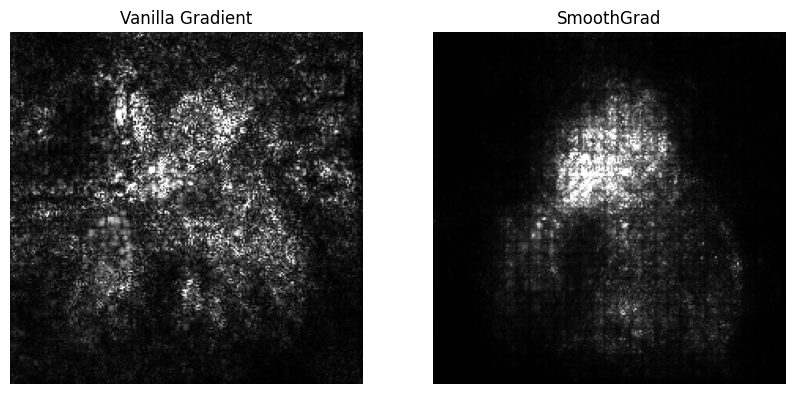

In [16]:
# Load the image
im_orig2 = LoadImage("https://drive.google.com/uc?export=view&id=1TuO4OoRutwpkwxr_T7W-imz5QvlIP20E")
imRes = PreprocessImageRes(im_orig2)

# Show the image
ShowImage(im_orig2)

predictions = model([np.array([imRes])])
prediction_class = np.argmax(predictions[0])
call_model_args = {class_idx_str: prediction_class}

print("Prediction class: " + str(prediction_class))


# Compute the vanilla mask and the smoothed mask.
vanilla_mask_3d_Res = gradient_saliency.GetMask(imRes, call_model_function, call_model_args)
smoothgrad_mask_3d_Res = gradient_saliency.GetSmoothedMask(imRes, call_model_function, call_model_args)

# Call the visualization methods to convert the 3D tensors to 2D grayscale.
vanilla_mask_grayscale_Res = saliency.VisualizeImageGrayscale(vanilla_mask_3d_Res)
smoothgrad_mask_grayscale_Res = saliency.VisualizeImageGrayscale(smoothgrad_mask_3d_Res)

# Set up matplot lib figures.
ROWS = 1
COLS = 2
UPSCALE_FACTOR = 10
P.figure(figsize=(ROWS * UPSCALE_FACTOR, COLS * UPSCALE_FACTOR))

# Render the saliency masks.
ShowGrayscaleImage(vanilla_mask_grayscale_Res, title='Vanilla Gradient', ax=P.subplot(ROWS, COLS, 1))
ShowGrayscaleImage(smoothgrad_mask_grayscale_Res, title='SmoothGrad', ax=P.subplot(ROWS, COLS, 2))

ResNet50 predicts class 208 which is "Labrador retriever".

### Let's plot the maps from the two different networks side by side

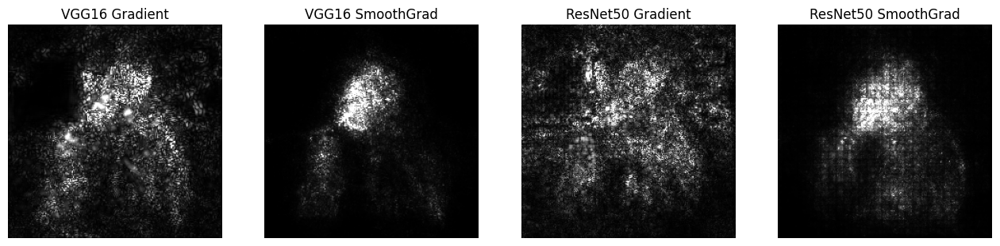

In [17]:
# Set up matplot lib figures.
ROWS = 1
COLS = 4
UPSCALE_FACTOR = 16
P.figure(figsize=(ROWS * UPSCALE_FACTOR, COLS * UPSCALE_FACTOR))

# Render the saliency masks — grouped by model for easier comparison.
ShowGrayscaleImage(vanilla_mask_grayscale, title='VGG16 Gradient', ax=P.subplot(ROWS, COLS, 1))
ShowGrayscaleImage(smoothgrad_mask_grayscale, title='VGG16 SmoothGrad', ax=P.subplot(ROWS, COLS, 2))
ShowGrayscaleImage(vanilla_mask_grayscale_Res, title='ResNet50 Gradient', ax=P.subplot(ROWS, COLS, 3))
ShowGrayscaleImage(smoothgrad_mask_grayscale_Res, title='ResNet50 SmoothGrad', ax=P.subplot(ROWS, COLS, 4))


### Why Model Documentation Matters (Model Cards)

You just saw that VGG16 and ResNet50 give **different predictions** and **different saliency maps** for the same image. VGG16 predicted "golden retriever" (207), ResNet50 predicted "Labrador retriever" (208) — close, but not identical. Their saliency maps highlight different regions too.

If you were choosing between these models for a real application, what would you want to know? `tf.keras.applications` gives you the model weights and an accuracy number — but almost nothing about:
- **Training data composition** — what demographics, geographies, lighting conditions were represented?
- **Known failure modes** — when does the model reliably get things wrong?
- **Intended use** — was this meant for fine-grained breed classification, or general object detection?

**Model Cards** (Mitchell et al., 2019) and **Datasheets for Datasets** (Gebru et al., 2018) are standardised documents designed to fill exactly these gaps.

**Exercise below:** Let's see what information Keras actually gives us about these models, then try filling in a simplified Model Card for VGG16.

In [19]:
# Exercise: What does tf.keras actually tell us about these models?

print("=" * 60)
print("VGG16 Model Information (from tf.keras)")
print("=" * 60)
print(f"  Model name:        {m.name}")
print(f"  Number of layers:  {len(m.layers)}")
print(f"  Total parameters:  {m.count_params():,}")
print(f"  Input shape:       {m.input_shape}")
print(f"  Output shape:      {m.output_shape}")
print()

print("=" * 60)
print("ResNet50 Model Information (from tf.keras)")
print("=" * 60)
print(f"  Model name:        {m2.name}")
print(f"  Number of layers:  {len(m2.layers)}")
print(f"  Total parameters:  {m2.count_params():,}")
print(f"  Input shape:       {m2.input_shape}")
print(f"  Output shape:      {m2.output_shape}")
print()

print("=" * 60)
print("What's MISSING?")
print("=" * 60)
missing_info = [
    "Training data composition (demographics, geography, lighting)",
    "Known failure modes and edge cases",
    "Intended use cases vs. out-of-scope uses",
    "Ethical considerations and bias analysis",
    "Performance across demographic subgroups",
    "Who built it, when, and why",
]
for item in missing_info:
    print(f"  - {item}")

print()
print(">> These gaps are exactly what Model Cards (Mitchell et al., 2019) aim to fill!")
print()
print("MINI EXERCISE: Based on what you've observed in this lab, fill in this")
print("simplified Model Card for VGG16 (discuss with your neighbour):")
print()
print("  Model name:           VGG16")
print("  Intended use:         General object detetction")
print("  Training data:        ImageNET")
print("  Known limitation:     Multiple objects in an image")
print("  A scenario where it")
print("  should NOT be used:   For scientific breed classification")

VGG16 Model Information (from tf.keras)
  Model name:        vgg16
  Number of layers:  23
  Total parameters:  138,357,544
  Input shape:       (None, 224, 224, 3)
  Output shape:      (None, 1000)

ResNet50 Model Information (from tf.keras)
  Model name:        resnet50
  Number of layers:  177
  Total parameters:  25,636,712
  Input shape:       (None, 224, 224, 3)
  Output shape:      (None, 1000)

What's MISSING?
  - Training data composition (demographics, geography, lighting)
  - Known failure modes and edge cases
  - Intended use cases vs. out-of-scope uses
  - Ethical considerations and bias analysis
  - Performance across demographic subgroups
  - Who built it, when, and why

>> These gaps are exactly what Model Cards (Mitchell et al., 2019) aim to fill!

MINI EXERCISE: Based on what you've observed in this lab, fill in this
simplified Model Card for VGG16 (discuss with your neighbour):

  Model name:           VGG16
  Intended use:         General object detetction
  Trainin

## Modifying Images

Now let's look at modifying the images. Can we get the model to misclassify? Can we cover part of the golden retriever puppy and get the model to classify the image as a cat (preferably as class 281, which is "tabby cat"). We have naively perturbed (by drawing on/covering parts) the image here in a few examples.

### Task:
Try modifying the image yourselves and see what happens!

Does the model behave in a way you would expect? Do the perturbations impact it's predictions in the same way it would a human's? Do the saliency maps help you understand what the model is doing?


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_23']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


Prediction class: 23


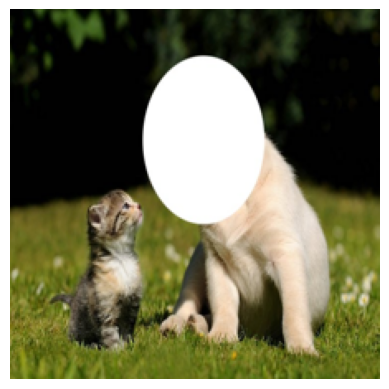

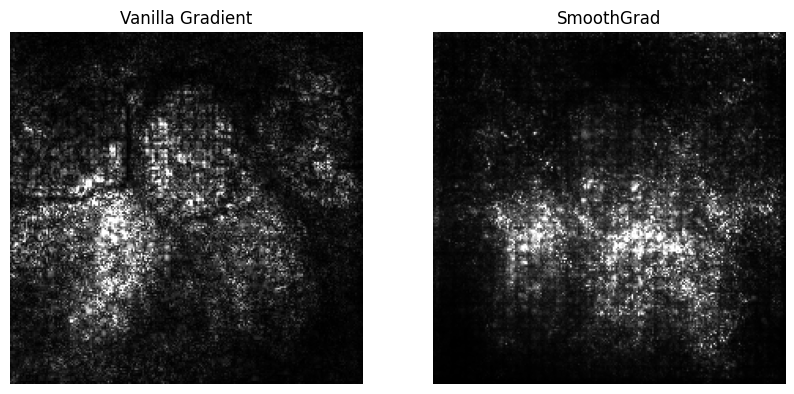

In [20]:
# Load the image
#Change the path in the line below if you want to try with a different image.
im_orig4 = LoadImage("https://drive.google.com/uc?export=view&id=11PoPYkzP-IO4u6FfiPTWISBybrgGTxtr")
im = PreprocessImageRes(im_orig4)

# Show the image
ShowImage(im_orig4)

predictions = model(np.array([im]))
prediction_class = np.argmax(predictions[0])
call_model_args = {class_idx_str: prediction_class}

print("Prediction class: " + str(prediction_class))

# Compute the vanilla mask and the smoothed mask.
vanilla_mask_3d_circle = gradient_saliency.GetMask(im, call_model_function, call_model_args)
smoothgrad_mask_3d_circle = gradient_saliency.GetSmoothedMask(im, call_model_function, call_model_args)

# Call the visualization methods to convert the 3D tensors to 2D grayscale.
vanilla_mask_grayscale_circle = saliency.VisualizeImageGrayscale(vanilla_mask_3d_circle)
smoothgrad_mask_grayscale_circle = saliency.VisualizeImageGrayscale(smoothgrad_mask_3d_circle)

# Set up matplot lib figures.
ROWS = 1
COLS = 2
UPSCALE_FACTOR = 10
P.figure(figsize=(ROWS * UPSCALE_FACTOR, COLS * UPSCALE_FACTOR))

# Render the saliency masks.
ShowGrayscaleImage(vanilla_mask_grayscale_circle, title='Vanilla Gradient', ax=P.subplot(ROWS, COLS, 1))
ShowGrayscaleImage(smoothgrad_mask_grayscale_circle, title='SmoothGrad', ax=P.subplot(ROWS, COLS, 2))

We have covered the dog's head, which in the smoothgrad map for the unperturbed image seemed to be the most important part of the input for the "Labrador retriever" class. Since we've perturbed the input, the network is now predicting class 23, which is "vulture" (which to a human is very different from a cat)! The maps are also now highlighting seemingly random parts of the image. As mentioned, since this is "random", different results are possible. Check: https://deeplearning.cms.waikato.ac.nz/user-guide/class-maps/IMAGENET/ for your results.




Prediction class: 359


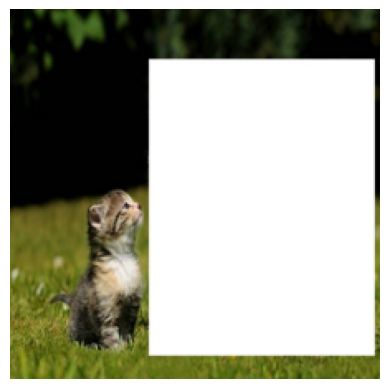

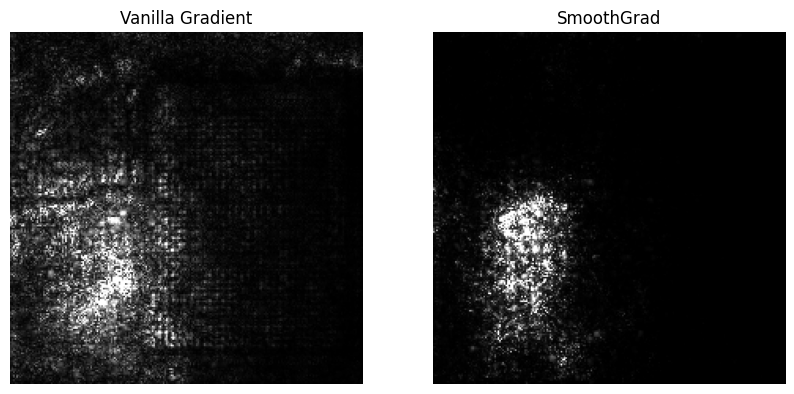

In [21]:
# Load the image
#Change the path in the line below if you want to try with a different image.
im_orig5 = LoadImage("https://drive.google.com/uc?export=view&id=1hw0kA7oQDkYlTosvEpfKt_FWGgw8XEh0")
im = PreprocessImageRes(im_orig5)

# Show the image
ShowImage(im_orig5)

predictions = model(np.array([im]))
prediction_class = np.argmax(predictions[0])
call_model_args = {class_idx_str: prediction_class}

print("Prediction class: " + str(prediction_class))

# Compute the vanilla mask and the smoothed mask.
vanilla_mask_3d_dots = gradient_saliency.GetMask(im, call_model_function, call_model_args)
smoothgrad_mask_3d_dots = gradient_saliency.GetSmoothedMask(im, call_model_function, call_model_args)

# Call the visualization methods to convert the 3D tensors to 2D grayscale.
vanilla_mask_grayscale_dots = saliency.VisualizeImageGrayscale(vanilla_mask_3d_dots)
smoothgrad_mask_grayscale_dots = saliency.VisualizeImageGrayscale(smoothgrad_mask_3d_dots)

# Set up matplot lib figures.
ROWS = 1
COLS = 2
UPSCALE_FACTOR = 10
P.figure(figsize=(ROWS * UPSCALE_FACTOR, COLS * UPSCALE_FACTOR))

# Render the saliency masks.
ShowGrayscaleImage(vanilla_mask_grayscale_dots, title='Vanilla Gradient', ax=P.subplot(ROWS, COLS, 1))
ShowGrayscaleImage(smoothgrad_mask_grayscale_dots, title='SmoothGrad', ax=P.subplot(ROWS, COLS, 2))

Next we've tried completely covering the dog part of the image. This time the saliency maps seem to focus mostly on the cat, however the model is predicting class 359 which is "ferret" - although somewhat closer to a cat than a vulture, still not what a human would classify from this image.

## Why doesn't covering the dog lead to the network classifying the cat?

Images that have been modified/perturb in this way are out of distribution for the network (the network won't have been trained on images with these kinds of perturbations/covers), so it's behaviour with these doesn't line up with how a human would interpret these images.

But do the saliency methods help realise this?

---
### Exercise: Build Your Own Perturbations in Code

So far we've used hand-edited images. Let's write code to **systematically** perturb images and observe how the model reacts. This lets us:
- Test many perturbations quickly
- Control exactly what changes
- Build intuition about model robustness

---

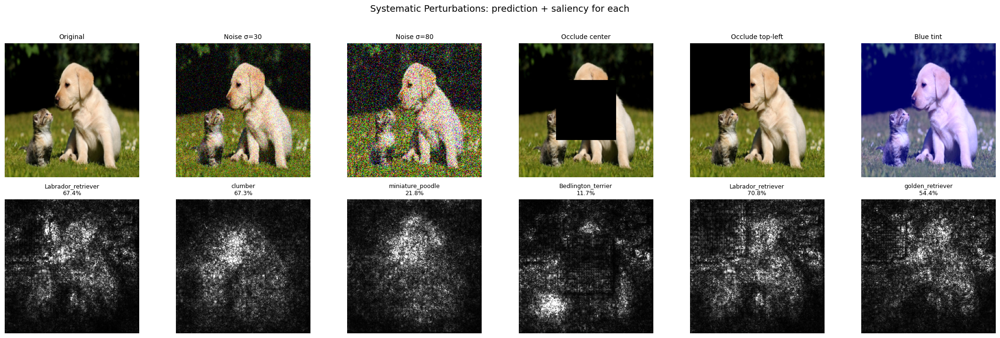

In [22]:
# Perturbation toolkit — three types of image perturbation
def add_gaussian_noise(image, sigma):
    """Add Gaussian noise with standard deviation sigma."""
    noise = np.random.normal(0, sigma, image.shape)
    noisy = np.clip(image.astype(np.float64) + noise, 0, 255).astype(np.uint8)
    return noisy

def add_occlusion_box(image, x, y, size, color=0):
    """Place a square occlusion box at (x, y) with given size."""
    occluded = image.copy()
    occluded[y:y+size, x:x+size] = color
    return occluded

def add_color_tint(image, channel, intensity=80):
    """Shift one color channel (0=red, 1=green, 2=blue)."""
    tinted = image.copy().astype(np.int16)
    tinted[:, :, channel] += intensity
    return np.clip(tinted, 0, 255).astype(np.uint8)

# Apply a battery of perturbations to the golden retriever image
perturbations = {
    'Original':         im_orig2,
    'Noise σ=30':       add_gaussian_noise(im_orig2, 30),
    'Noise σ=80':       add_gaussian_noise(im_orig2, 80),
    'Occlude center':   add_occlusion_box(im_orig2, 62, 62, 100),
    'Occlude top-left': add_occlusion_box(im_orig2, 0, 0, 100),
    'Blue tint':        add_color_tint(im_orig2, 2, 100),
}

fig, axes = P.subplots(2, len(perturbations), figsize=(22, 7))

for col, (name, perturbed_img) in enumerate(perturbations.items()):
    axes[0, col].imshow(perturbed_img)
    axes[0, col].set_title(name, fontsize=10)
    axes[0, col].axis('off')

    # Predict with ResNet50
    im_pre = PreprocessImageRes(perturbed_img)
    preds = model(np.array([im_pre])).numpy()[0]
    top_class = np.argmax(preds)
    confidence = preds[top_class] * 100

    # Gradient saliency (faster than SmoothGrad for a quick survey)
    args = {class_idx_str: int(top_class)}
    mask = gradient_saliency.GetMask(im_pre, call_model_function, args)
    mask_gray = saliency.VisualizeImageGrayscale(mask)

    axes[1, col].imshow(mask_gray, cmap=P.cm.gray, vmin=0, vmax=1)
    axes[1, col].set_title(f"{get_class_name(top_class)}\n{confidence:.1f}%", fontsize=9)
    axes[1, col].axis('off')

P.suptitle("Systematic Perturbations: prediction + saliency for each", fontsize=14, y=1.02)
P.tight_layout()
P.show()

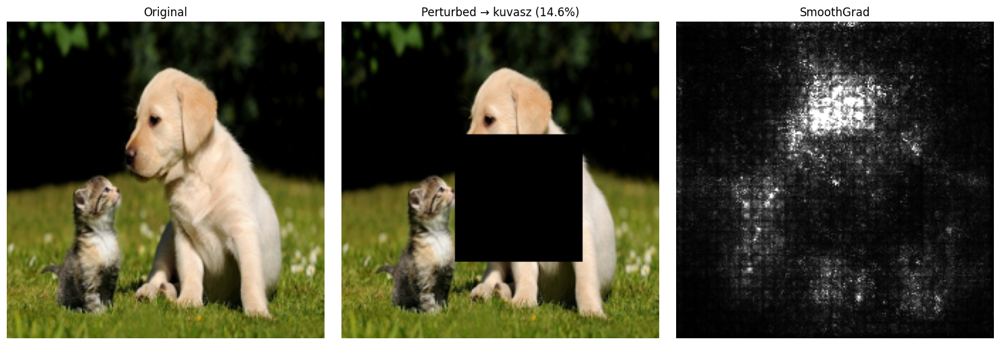

Original prediction:  Labrador_retriever (67.4%)
Perturbed prediction: kuvasz (14.6%)
>> Class changed! The model is NOT robust to this perturbation.


In [27]:
# YOUR TURN: Experiment with perturbations!
# Modify the parameters below and re-run this cell to explore.
# Questions to investigate:
#   1. What is the SMALLEST noise level that changes the prediction?
#   2. Where must you place an occlusion box to flip the class?
#   3. Does a color tint affect the prediction differently from noise?

# ---- Modify these! ----
custom_image = add_occlusion_box(im_orig2, 80, 80, 90)
add_gaussian_noise(im_orig2, 20)
add_color_tint(im_orig2, 0, 120)   # strong red tint
add_occlusion_box(im_orig2, 50, 80, 80, color=255)  # white box
# ---- End modify ----

im_custom = PreprocessImageRes(custom_image)
preds_custom = model(np.array([im_custom])).numpy()[0]
top_class = np.argmax(preds_custom)

# Compute SmoothGrad for the custom perturbation
smooth_custom = gradient_saliency.GetSmoothedMask(
    im_custom, call_model_function, {class_idx_str: int(top_class)})

fig, axes = P.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(im_orig2); axes[0].set_title('Original'); axes[0].axis('off')
axes[1].imshow(custom_image)
axes[1].set_title(f'Perturbed → {get_class_name(top_class)} ({preds_custom[top_class]*100:.1f}%)')
axes[1].axis('off')
axes[2].imshow(saliency.VisualizeImageGrayscale(smooth_custom), cmap=P.cm.gray, vmin=0, vmax=1)
axes[2].set_title('SmoothGrad'); axes[2].axis('off')
P.tight_layout()
P.show()

# Compare with original prediction
orig_preds = model(np.array([PreprocessImageRes(im_orig2)])).numpy()[0]
orig_class = np.argmax(orig_preds)
print(f"Original prediction:  {get_class_name(orig_class)} ({orig_preds[orig_class]*100:.1f}%)")
print(f"Perturbed prediction: {get_class_name(top_class)} ({preds_custom[top_class]*100:.1f}%)")
if top_class == orig_class:
    print(">> Same class — the model is robust to this perturbation.")
else:
    print(">> Class changed! The model is NOT robust to this perturbation.")

The robustness depends on all metrics we have pertrubed, not noise alone. If we restrict the occulsion box size, the tint, then we can claim there is a minimum threshold.

### Robustness, Trustworthiness & Human-in-the-Loop

The model predicted "vulture" for a dog with its head covered, and "ferret" for an image with the dog fully obscured. These are **out-of-distribution** inputs, and the model fails silently — no error, no uncertainty warning, just a confident wrong answer.

This connects to three important ideas:

- **Robustness:** A model is robust if small or reasonable input changes don't cause catastrophic output changes. Clearly, these perturbations broke that contract.
- **Usable vs. Useful vs. Trustworthy:** A model can be *usable* (easy to call) and *useful* (accurate on test data) but still not *trustworthy* (reliable under real-world conditions).
- **Human-in-the-loop:** If this model were deployed for medical imaging, these silent failures could be dangerous. A **human-in-the-loop** design would flag low-confidence or anomalous predictions for human review.

**Reflection:** If you were deploying an X-ray classifier in a hospital, what safeguards would you want? Would saliency maps alone be sufficient for a doctor to trust the system?

**Exercise below:** Let's quantify *how confident* the model is in its wrong predictions.

Original image — Top 5 predictions:
  Class  208 (Labrador_retriever):  67.36% confidence
  Class  207 (golden_retriever):  29.75% confidence
  Class  222 (kuvasz):   2.03% confidence
  Class  205 (flat-coated_retriever):   0.11% confidence
  Class  209 (Chesapeake_Bay_retriever):   0.09% confidence

Perturbed image (head covered) — Top 5 predictions:
  Class   23 (vulture):  21.29% confidence
  Class  359 (black-footed_ferret):   9.11% confidence
  Class  722 (ping-pong_ball):   3.67% confidence
  Class  249 (malamute):   3.65% confidence
  Class  358 (polecat):   2.99% confidence


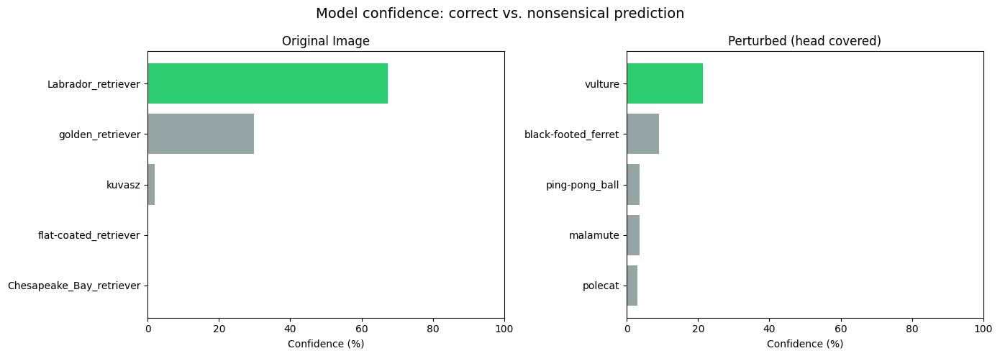


>> Notice: the model can be HIGHLY confident even when wrong!
>> This is exactly why human-in-the-loop oversight matters in high-stakes applications.


In [28]:
# Exercise: How CONFIDENT is the model in its (wrong) predictions?
# Compare prediction confidence on the original vs perturbed images.

# Original golden retriever image — preprocessed for ResNet50
im_res_orig = PreprocessImageRes(im_orig2)
preds_original = model(np.array([im_res_orig])).numpy()[0]

# Perturbed image (head covered) — also preprocess for ResNet50
im_res_pert = PreprocessImageRes(im_orig4)
preds_perturbed = model(np.array([im_res_pert])).numpy()[0]

# Top-5 predictions for each
print("=" * 60)
print("Original image — Top 5 predictions:")
print("=" * 60)
top5_orig = np.argsort(preds_original)[-5:][::-1]
for idx in top5_orig:
    print(f"  Class {idx:4d} ({get_class_name(idx)}): {preds_original[idx]*100:6.2f}% confidence")

print()
print("=" * 60)
print("Perturbed image (head covered) — Top 5 predictions:")
print("=" * 60)
top5_pert = np.argsort(preds_perturbed)[-5:][::-1]
for idx in top5_pert:
    print(f"  Class {idx:4d} ({get_class_name(idx)}): {preds_perturbed[idx]*100:6.2f}% confidence")

# Visual comparison
fig, axes = P.subplots(1, 2, figsize=(14, 5))

for ax, preds, title in [(axes[0], preds_original, 'Original Image'),
                          (axes[1], preds_perturbed, 'Perturbed (head covered)')]:
    top_idx = np.argsort(preds)[-5:][::-1]
    top_probs = preds[top_idx] * 100
    colors = ['#2ecc71' if i == 0 else '#95a5a6' for i in range(5)]
    ax.barh(range(5), top_probs, color=colors)
    ax.set_yticks(range(5))
    ax.set_yticklabels([get_class_name(i) for i in top_idx])
    ax.set_xlabel('Confidence (%)')
    ax.set_title(title)
    ax.set_xlim(0, 100)
    ax.invert_yaxis()

P.suptitle('Model confidence: correct vs. nonsensical prediction', fontsize=14)
P.tight_layout()
P.show()

print("\n>> Notice: the model can be HIGHLY confident even when wrong!")
print(">> This is exactly why human-in-the-loop oversight matters in high-stakes applications.")

### Exercise: Build a Human-in-the-Loop Flagging System

In high-stakes applications (healthcare, justice, autonomous vehicles), we can't just trust every model prediction blindly. A **human-in-the-loop** system automatically flags predictions that might be unreliable, routing them to a human expert for review.

What signals suggest a prediction is unreliable?
- **Low confidence** — the model's top prediction has low probability
- **High entropy** — the probability mass is spread across many classes (the model is "unsure")
- **Ambiguity** — the top-2 predictions are very close in probability

Let's build one and test it on our images.

In [29]:
# Define the flagging system

def prediction_entropy(predictions):
    """Shannon entropy of the prediction distribution (bits).
    High entropy = uncertain, Low entropy = confident."""
    p = predictions[predictions > 1e-10]
    return -np.sum(p * np.log2(p))

def should_flag_for_review(predictions, confidence_threshold=0.5, entropy_threshold=5.0):
    """Decide whether this prediction needs human review.
    Returns (flag: bool, reason: str)."""
    top_confidence = np.max(predictions)
    entropy = prediction_entropy(predictions)

    reasons = []
    if top_confidence < confidence_threshold:
        reasons.append(f"low confidence ({top_confidence*100:.1f}%)")
    if entropy > entropy_threshold:
        reasons.append(f"high entropy ({entropy:.2f} bits)")

    # Check if top-2 predictions are very close (the model is "torn")
    sorted_preds = np.sort(predictions)[::-1]
    if sorted_preds[0] - sorted_preds[1] < 0.10:
        reasons.append(f"ambiguous (top-2 gap only {(sorted_preds[0]-sorted_preds[1])*100:.1f}%)")

    if reasons:
        return True, "; ".join(reasons)
    return False, "confident prediction"

# Quick demo
demo_preds = np.zeros(1000)
demo_preds[208] = 0.92; demo_preds[207] = 0.05; demo_preds[0] = 0.03
flag, reason = should_flag_for_review(demo_preds)
print(f"Demo (confident):  flag={flag}, reason='{reason}'")

demo_preds2 = np.ones(1000) / 1000  # uniform = maximum uncertainty
flag2, reason2 = should_flag_for_review(demo_preds2)
print(f"Demo (uncertain):  flag={flag2}, reason='{reason2}'")
print()
print("System ready! Run the next cell to test on our images.")

Demo (confident):  flag=False, reason='confident prediction'
Demo (uncertain):  flag=True, reason='low confidence (0.1%); high entropy (9.97 bits); ambiguous (top-2 gap only 0.0%)'

System ready! Run the next cell to test on our images.


In [30]:
# Test the flagging system on all our images (original + perturbed)

test_images = {
    'Doberman (original)':       im_orig,
    'Golden retriever (orig.)':  im_orig2,
    'Head covered':              im_orig4,
    'Dog covered (dots)':        im_orig5,
}

# Also add some programmatic perturbations
test_images['Gaussian noise σ=80'] = add_gaussian_noise(im_orig2, 80)
test_images['Center occluded']     = add_occlusion_box(im_orig2, 62, 62, 100)

print("=" * 100)
print(f"  {'Image':<28} {'Prediction':<22} {'Conf.':>7} {'Entropy':>9} {'Flag':>6}  Reason")
print("=" * 100)

flagged_count = 0
for name, img in test_images.items():
    im_pre = PreprocessImageRes(img)
    preds = model(np.array([im_pre])).numpy()[0]
    top_cls = np.argmax(preds)
    conf = preds[top_cls]
    ent = prediction_entropy(preds)
    flag, reason = should_flag_for_review(preds)
    if flag:
        flagged_count += 1

    marker = " ** " if flag else "    "
    print(f"{marker}{name:<28} {get_class_name(top_cls):<22} {conf*100:>6.1f}% {ent:>8.2f}  {'YES':>5}  {reason}" if flag
          else f"    {name:<28} {get_class_name(top_cls):<22} {conf*100:>6.1f}% {ent:>8.2f}  {'no':>5}  {reason}")

print("=" * 100)
print(f"\n>> {flagged_count}/{len(test_images)} images flagged for human review.")
print()
print("DISCUSSION QUESTIONS:")
print("  1. Would you adjust the thresholds for a medical imaging system? How?")
print("  2. What is the cost of a false negative (missing a bad prediction)?")
print("  3. What is the cost of a false positive (flagging a good prediction)?")
print("  4. How would you measure whether your flagging system is working well?")

  Image                        Prediction               Conf.   Entropy   Flag  Reason


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_23']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


    Doberman (original)          Doberman                 97.7%     0.22     no  confident prediction
    Golden retriever (orig.)     Labrador_retriever       67.4%     1.12     no  confident prediction
 ** Head covered                 vulture                  21.3%     5.61    YES  low confidence (21.3%); high entropy (5.61 bits)
 ** Dog covered (dots)           black-footed_ferret      27.6%     3.35    YES  low confidence (27.6%); ambiguous (top-2 gap only 5.1%)
 ** Gaussian noise σ=80          standard_poodle          38.6%     2.34    YES  low confidence (38.6%)
 ** Center occluded              Bedlington_terrier       11.7%     5.97    YES  low confidence (11.7%); high entropy (5.97 bits); ambiguous (top-2 gap only 3.0%)

>> 4/6 images flagged for human review.

DISCUSSION QUESTIONS:
  1. Would you adjust the thresholds for a medical imaging system? How?
  2. What is the cost of a false negative (missing a bad prediction)?
  3. What is the cost of a false positive (flagging a go

For ajdusting the treshold in a medical imaging system, we would need a medical expert in the loop as well as an AI expert.

False negative is more costly than false positive, it can cause unitended harm.

Flagging a good prediction is not as costly, but can lead to wastage of resources in already constarined settings like the medical imaging sector.

We can update the system based on feedback, as the training data may not represent the updated ground truth.

Prediction class: 282


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_23']]
Received: inputs=['Tensor(shape=(1, 224, 224, 3))']
  warnings.warn(msg)


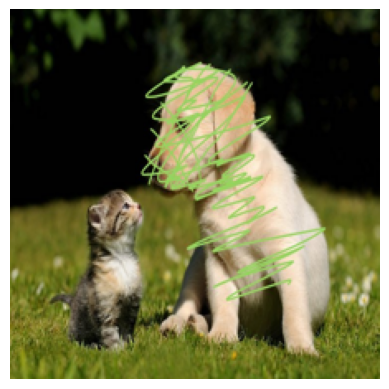

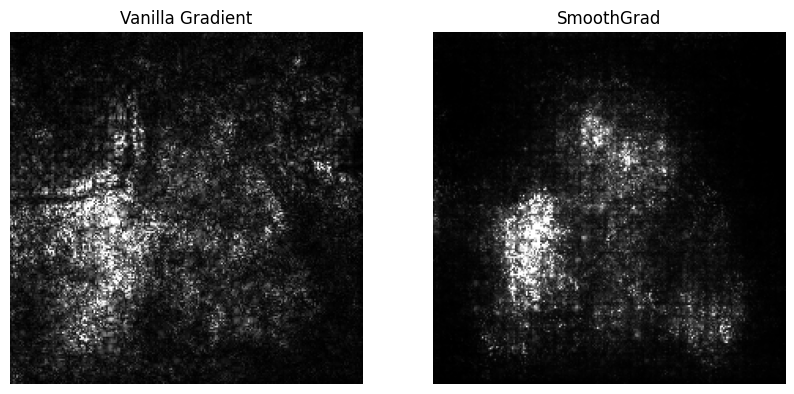

In [31]:
# Load the image
#Change the path in the line below if you want to try with a different image.
im_orig3 = LoadImage("https://drive.google.com/uc?export=view&id=13k3rfcStazAPr8NFgQM7K2ChgcT16-eC")
im = PreprocessImageRes(im_orig3)

# Show the image
ShowImage(im_orig3)

predictions = model(np.array([im]))
prediction_class = np.argmax(predictions[0])
call_model_args = {class_idx_str: prediction_class}

print("Prediction class: " + str(prediction_class))

# Compute the vanilla mask and the smoothed mask.
vanilla_mask_3d_scribble = gradient_saliency.GetMask(im, call_model_function, call_model_args)
smoothgrad_mask_3d_scribble = gradient_saliency.GetSmoothedMask(im, call_model_function, call_model_args)

# Call the visualization methods to convert the 3D tensors to 2D grayscale.
vanilla_mask_grayscale_scribble = saliency.VisualizeImageGrayscale(vanilla_mask_3d_scribble)
smoothgrad_mask_grayscale_scribble = saliency.VisualizeImageGrayscale(smoothgrad_mask_3d_scribble)

# Set up matplot lib figures.
ROWS = 1
COLS = 2
UPSCALE_FACTOR = 10
P.figure(figsize=(ROWS * UPSCALE_FACTOR, COLS * UPSCALE_FACTOR))

# Render the saliency masks.
ShowGrayscaleImage(vanilla_mask_grayscale_scribble, title='Vanilla Gradient', ax=P.subplot(ROWS, COLS, 1))
ShowGrayscaleImage(smoothgrad_mask_grayscale_scribble, title='SmoothGrad', ax=P.subplot(ROWS, COLS, 2))

In one last attempt, we have perturbed the image by scribbling on the dog rather than covering it completely - the reasoning being that this is somewhat more similar to what might occur naturally (e.g. if the dog were partly obscured behind plants), however this is just be a lucky guess! This time the network predicts class 282, which is "tiger cat" (which is almost identical to tabby cat). The saliency maps now mostly focus on the cat but are still highlighting parts of the dog.

Note: Having also tried these images on VGG16, the same perturbations cause the model to predict completely different classes, and each model would likely behave differently with these kinds of out of distribution perturbations.



---
### Exercise: Saliency-Guided Occlusion — Are the Saliency Maps Actually Right?

We've been *looking at* saliency maps, but how do we know they're correct? Here's a simple **sanity check**: if saliency correctly identifies important pixels, then **occluding those pixels should change the prediction**.

We'll progressively mask the top 10%, 25%, 50%, and 75% most salient pixels (replacing them with gray), and see what happens to the prediction. If the model's confidence drops and the class changes, the saliency map was pointing at genuinely important regions.

---

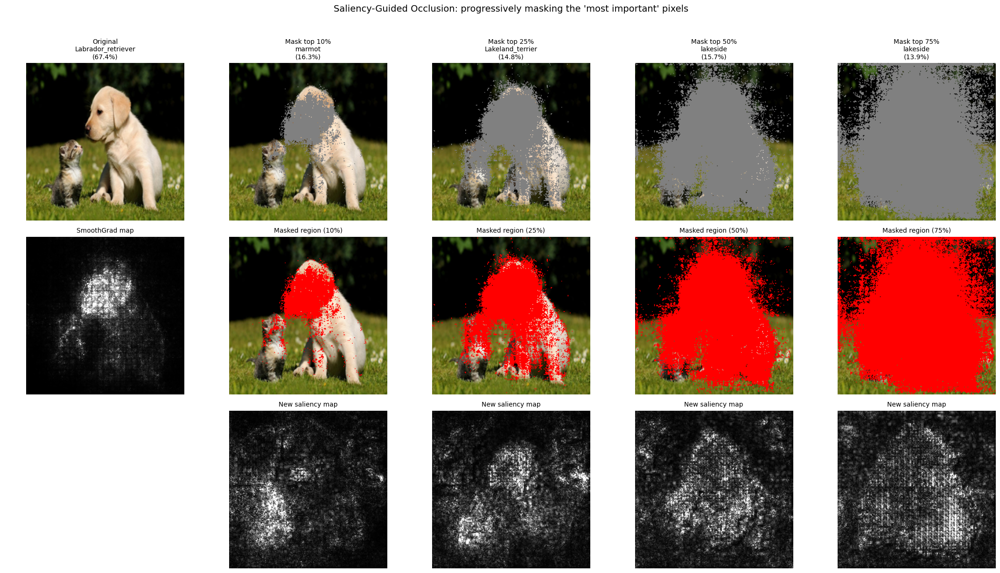


Results summary:
Occlusion       Prediction                Confidence
----------------------------------------------------
Original        Labrador_retriever             67.4%
Top 10%         marmot                         16.3%
Top 25%         Lakeland_terrier               14.8%
Top 50%         lakeside                       15.7%
Top 75%         lakeside                       13.9%

>> If prediction drops as we remove more salient pixels, the saliency map
>> is pointing at genuinely important regions — a basic SANITY CHECK.
>> If it doesn't drop, the explanation method may be unreliable!
>> This kind of validation is essential before trusting any explanation method.


In [32]:
# Saliency-Guided Occlusion sanity check

# Use the golden retriever with ResNet50
im_test = im_orig2.copy()
im_test_pre = PreprocessImageRes(im_test)

# Get baseline prediction and saliency
preds_baseline = model(np.array([im_test_pre])).numpy()[0]
class_baseline = np.argmax(preds_baseline)
args_test = {class_idx_str: int(class_baseline)}

smooth_mask = gradient_saliency.GetSmoothedMask(im_test_pre, call_model_function, args_test)
smooth_gray = saliency.VisualizeImageGrayscale(smooth_mask)

# Progressively occlude most salient pixels
thresholds = [10, 25, 50, 75]
fig, axes = P.subplots(3, len(thresholds) + 1, figsize=(22, 12))

# Column 0: original
axes[0, 0].imshow(im_test)
axes[0, 0].set_title(f"Original\n{get_class_name(class_baseline)}\n({preds_baseline[class_baseline]*100:.1f}%)",
                      fontsize=10)
axes[0, 0].axis('off')
axes[1, 0].imshow(smooth_gray, cmap=P.cm.gray, vmin=0, vmax=1)
axes[1, 0].set_title("SmoothGrad map", fontsize=10)
axes[1, 0].axis('off')
axes[2, 0].axis('off')

results = [("Original", get_class_name(class_baseline), preds_baseline[class_baseline] * 100)]

for col, pct in enumerate(thresholds, 1):
    # Find threshold for top-k% most salient pixels
    cutoff = np.percentile(smooth_gray, 100 - pct)
    salient_mask = smooth_gray >= cutoff

    # Create occluded image (replace salient pixels with gray)
    occluded = im_test.copy()
    occluded[salient_mask] = 128

    # Predict on occluded image
    occ_pre = PreprocessImageRes(occluded)
    preds_occ = model(np.array([occ_pre])).numpy()[0]
    class_occ = np.argmax(preds_occ)

    results.append((f"Top {pct}%", get_class_name(class_occ), preds_occ[class_occ] * 100))

    # Row 0: occluded image + prediction
    axes[0, col].imshow(occluded)
    axes[0, col].set_title(f"Mask top {pct}%\n{get_class_name(class_occ)}\n({preds_occ[class_occ]*100:.1f}%)",
                            fontsize=10)
    axes[0, col].axis('off')

    # Row 1: which pixels were occluded (red overlay)
    overlay = im_test.copy().astype(np.float32) / 255.0
    overlay[salient_mask] = [1, 0, 0]
    axes[1, col].imshow(overlay)
    axes[1, col].set_title(f"Masked region ({pct}%)", fontsize=10)
    axes[1, col].axis('off')

    # Row 2: NEW saliency map on the occluded image
    new_args = {class_idx_str: int(class_occ)}
    new_mask = gradient_saliency.GetMask(occ_pre, call_model_function, new_args)
    axes[2, col].imshow(saliency.VisualizeImageGrayscale(new_mask), cmap=P.cm.gray, vmin=0, vmax=1)
    axes[2, col].set_title(f"New saliency map", fontsize=10)
    axes[2, col].axis('off')

P.suptitle("Saliency-Guided Occlusion: progressively masking the 'most important' pixels",
           fontsize=14, y=1.02)
P.tight_layout()
P.show()

# Summary table
print("\nResults summary:")
print(f"{'Occlusion':<15} {'Prediction':<25} {'Confidence':>10}")
print("-" * 52)
for name, cls_name, conf in results:
    print(f"{name:<15} {cls_name:<25} {conf:>9.1f}%")

print()
print(">> If prediction drops as we remove more salient pixels, the saliency map")
print(">> is pointing at genuinely important regions — a basic SANITY CHECK.")
print(">> If it doesn't drop, the explanation method may be unreliable!")
print(">> This kind of validation is essential before trusting any explanation method.")

## Discussion Questions

Here are five questions to think about and discuss:

1. **Can we find individual neurons that represent specific concepts** (e.g. "floppy ears", "wheel") inside a network? What would that tell us that saliency maps can't? *(mechanistic interpretability)*

2. **What information should a "Model Card" contain** beyond top-line accuracy? Who is the audience for that document? *(AI documentation & governance)*

3. **Who is responsible when a deployed model fails** — in healthcare, hiring, or criminal justice? The developer? The deployer? The regulator? *(AI governance)*

4. **What is the difference between *interpretable* and *trustworthy*?** Can a model be one without the other? *(trust frameworks)*

5. **How would you audit a training dataset for bias** if you can't inspect every image? What proxies or statistics would you use? *(fairness & auditing)*

> Take notes on your initial answers and discuss with your neighbours.


1. We can possibly find a group of neurons that represent specific concepts, such as in CNNs. This is a core goal of mechanistic interpretability. While saliency maps are a peek into what regions in an image the network may be relying on to make a prediction, mechanistic interpretability could help us identify what neurons are activated for specific regions in the image, to make the predicition.

2. A Model Card should contain information on the model's intended usage, data used for training the model, how the data was obatined, any known technical and ethical limitations, how the model should be regulated, model uncertainity, and if there is any residual bias in the model, it should also be explained. These are some basic concepts. There could be more considerations for AI Governance.

3. Interpretability and trustworthyness of an AI model are highly interlinked. In high stakes domains like medical analysis, robotics, etc, these are two could be inseprable for efficient deployment from an AI governance perspective.

4. We could use demographic proxies (age, gender, race freqeuncy), enviornmental proxies, and cross dataset generalisation, etc.